<html><head><meta content="text/html; charset=UTF-8" http-equiv="content-type"><style type="text/css">ol</style></head><body class="c5"><p class="c0 c4"><span class="c3"></span></p><p class="c2 title" id="h.rrbabt268i6e"><h1>CaImAn&rsquo;s Demo pipeline</h1></p><p class="c0"><span class="c3">This notebook will help to demonstrate the process of CaImAn and how it uses different functions to denoise, deconvolve and demix neurons from a two-photon Calcium Imaging dataset. The demo shows how to construct the `params`, `MotionCorrect` and `cnmf` objects and call the relevant functions. You can also run a large part of the pipeline with a single method (`cnmf.fit_file`). See inside for details.

Dataset couresy of Sue Ann Koay and David Tank (Princeton University)

This demo pertains to two photon data. For a complete analysis pipeline for one photon microendoscopic data see demo_pipeline_cnmfE.ipynb</span></p>
<p><img src="../../docs/img/quickintro.png" /></p>
<p class="c0"><span class="c3">More information can be found in the companion paper. </span></p>
</html>



In [1]:

import bokeh.plotting as bpl
import cv2
import glob
import logging
import matplotlib.pyplot as plt
import numpy as np
import os

try:
    cv2.setNumThreads(0)
except():
    pass

try:
    if __IPYTHON__:
        # this is used for debugging purposes only. allows to reload classes
        # when changed
        get_ipython().magic('load_ext autoreload')
        get_ipython().magic('autoreload 2')
except NameError:
    pass

import caiman as cm
from caiman.motion_correction import MotionCorrect
from caiman.source_extraction.cnmf import cnmf as cnmf
from caiman.source_extraction.cnmf import params as params
from caiman.utils.utils import download_demo
from caiman.utils.visualization import plot_contours, nb_view_patches, nb_plot_contour
bpl.output_notebook()

import pylab as pl


Loading BokehJS ...

### Set up logger (optional)
You can log to a file using the filename parameter, or make the output more or less verbose by setting level to `logging.DEBUG`, `logging.INFO`, `logging.WARNING`, or `logging.ERROR`. A filename argument can also be passed to store the log file

In [2]:
logging.basicConfig(format=
                          "%(relativeCreated)12d [%(filename)s:%(funcName)20s():%(lineno)s] [%(process)d] %(message)s",
                    # filename="/tmp/caiman.log",
                    level=logging.WARNING)

### Select file(s) to be processed
The `download_demo` function will download the specific file for you and return the complete path to the file which will be stored in your `caiman_data` directory. If you adapt this demo for your data make sure to pass the complete path to your file(s). Remember to pass the `fname` variable as a list.

In [3]:
# fnames = ['Sue_2x_3000_40_-46.tif']  # filename to be processed
# if fnames[0] in ['Sue_2x_3000_40_-46.tif', 'demoMovie.tif']:
#     fnames = [download_demo(fnames[0])]
#rootdir = '/n/home00/juliana.rhee/caiman_data/testdata_jyr'
rootdir = '/n/coxfs01/2p-data'
animalid = 'JC084'
session = '20190522' #'20190505_JC083'
session_dir = os.path.join(rootdir, animalid, session)

fov = 'FOV1_zoom2p0x'
run_list = ['retino_run2', 'rfs']
run_label = 'retino2_rfs'
fnames = []
for run in run_list:
    fnames_tmp = glob.glob(os.path.join(session_dir, fov, '%s*' % run, 'raw*', '*.tif'))
    fnames.extend(fnames_tmp)
    print("[%s]: added %i tifs to queue." % (run, len(fnames_tmp)))

#print(fnames)

##fnames = glob.glob(os.path.join('/n/coxfs01/2p-data/JC083/20190505/FOV1_zoom2p0x/gratings_run1/raw*', '*.tif'))
#print(fnames)



[retino_run2]: added 12 tifs to queue.
[rfs]: added 66 tifs to queue.


In [4]:

data_identifier = '|'.join([animalid, session, fov, run_label])

print("*** Dataset: %s ***" % data_identifier)

*** Dataset: JC084|20190522|FOV1_zoom2p0x|retino2_rfs ***


#### Save Caiman output to separate dir

In [5]:
results_dir = os.path.join(session_dir, fov, 'caiman_results', '_'.join(run_list))
if not os.path.exists(results_dir):
    os.makedirs(results_dir)
print(results_dir)

/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/caiman_results/retino_run2_rfs


#### Load previous MC

['/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/caiman_results/retino_run2_rfs/mc_rigid.npz']


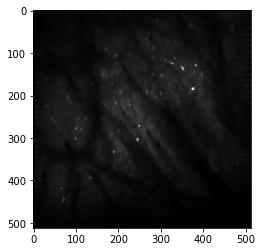

In [6]:
#prev_mcs = glob.glob(os.path.join(session_dir, fov, '*run*', 'caiman_results', 'mc_rigid.npz'))
prev_mcs = glob.glob(os.path.join(results_dir, 'mc_rigid.npz'))
print(prev_mcs)
if len(prev_mcs) == 0:
    mc_results_file = None
else:
    mc_results_file = prev_mcs[0]

if mc_results_file is not None:
    mcr = np.load(mc_results_file)
    # for k in mcr.keys():
    #     print(k, mcr[k])
    plt.imshow(mcr['total_template_rig'], cmap = 'gray')

### Play the movie (optional)
Play the movie (optional). This will require loading the movie in memory which in general is not needed by the pipeline. Displaying the movie uses the OpenCV library. Press `q` to close the video panel.

In [7]:
display_movie = False
if display_movie:
    m_orig = cm.load_movie_chain(fnames)
    ds_ratio = 0.0001
    m_orig.resize(.5, .5, ds_ratio).play(
        q_max=99.5, fr=30, magnification=2)

### Setup some parameters
We set some parameters that are relevant to the file, and then parameters for motion correction, processing with CNMF and component quality evaluation. Note that the dataset `Sue_2x_3000_40_-46.tif` has been spatially downsampled by a factor of 2 and has a lower than usual spatial resolution (2um/pixel). As a result several parameters (`gSig, strides, max_shifts, rf, stride_cnmf`) have lower values (halved compared to a dataset with spatial resolution 1um/pixel). 

In [8]:
# dataset dependent parameters
fr = 44.65                           # imaging rate in frames per second
decay_time = 0.4                    # length of a typical transient in seconds

# motion correction parameters
strides = (96, 96) #(48, 48)          # start a new patch for pw-rigid motion correction every x pixels
overlaps = (24, 24)         # overlap between pathes (size of patch strides+overlaps)
max_shifts = (12, 12) #(6,6)          # maximum allowed rigid shifts (in pixels)
max_deviation_rigid = 6 #3     # maximum shifts deviation allowed for patch with respect to rigid shifts
pw_rigid = False             # flag for performing non-rigid motion correction

# parameters for source extraction and deconvolution
p = 1                       # order of the autoregressive system
gnb = 2                     # number of global background components
merge_thr = 0.85            # merging threshold, max correlation allowed
rf = 30 #15                     # half-size of the patches in pixels. e.g., if rf=25, patches are 50x50
stride_cnmf = 12 #6             # amount of overlap between the patches in pixels
K = 20 #8                       # number of components per patch
gSig = [3, 3]               # expected half size of neurons in pixels
method_init = 'greedy_roi'  # initialization method (if analyzing dendritic data using 'sparse_nmf')
ssub = 1                    # spatial subsampling during initialization
tsub = 1                    # temporal subsampling during intialization

# parameters for component evaluation
min_SNR = 2.0               # signal to noise ratio for accepting a component
rval_thr = 0.85              # space correlation threshold for accepting a component
cnn_thr = 0.99              # threshold for CNN based classifier
cnn_lowest = 0.1 # neurons with cnn probability lower than this value are rejected


### Create a parameters object
You can creating a parameters object by passing all the parameters as a single dictionary. Parameters not defined in the dictionary will assume their default values. The resulting `params` object is a collection of subdictionaries pertaining to the dataset to be analyzed `(params.data)`, motion correction `(params.motion)`, data pre-processing `(params.preprocess)`, initialization `(params.init)`, patch processing `(params.patch)`, spatial and temporal component `(params.spatial), (params.temporal)`, quality evaluation `(params.quality)` and online processing `(params.online)`

In [9]:
opts_dict = {'fnames': fnames,
            'fr': fr,
            'decay_time': decay_time,
            'strides': strides,
            'overlaps': overlaps,
            'max_shifts': max_shifts,
            'max_deviation_rigid': max_deviation_rigid,
            'pw_rigid': pw_rigid,
            'p': 1,
            'nb': gnb,
            'rf': rf,
            'K': K, 
            'stride': stride_cnmf,
            'method_init': method_init,
            'rolling_sum': True,
            'only_init': True,
            'ssub': ssub,
            'tsub': tsub,
            'merge_thr': merge_thr, 
            'min_SNR': min_SNR,
            'rval_thr': rval_thr,
            'use_cnn': True,
            'min_cnn_thr': cnn_thr,
            'cnn_lowest': cnn_lowest}

opts = params.CNMFParams(params_dict=opts_dict)

       52235 [params.py:                 set():786] [6289] Changing key fnames in group data from None to ['/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4/fov1_retinobar_00001.tif', '/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4/fov1_retinobar_00002.tif', '/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4/fov1_retinobar_00003.tif', '/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4/fov1_retinobar_00004.tif', '/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4/fov1_retinobar_00005.tif', '/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4/fov1_retinobar_00006.tif', '/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4/fov1_retinobar_00007.tif', '/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4/fov1_retinobar_00008.tif', '/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4/fov1_retinobar_00009.tif', '/

       52260 [params.py:                 set():786] [6289] Changing key nb in group temporal from 1 to 2
       52261 [params.py:                 set():786] [6289] Changing key merge_thr in group merging from 0.8 to 0.85
       52262 [params.py:                 set():786] [6289] Changing key min_SNR in group quality from 2.5 to 2.0
       52266 [params.py:                 set():786] [6289] Changing key rval_thr in group quality from 0.8 to 0.85
       52267 [params.py:                 set():786] [6289] Changing key min_cnn_thr in group quality from 0.9 to 0.99
       52267 [params.py:                 set():786] [6289] Changing key min_SNR in group online from 2.5 to 2.0
       52268 [params.py:                 set():786] [6289] Changing key rval_thr in group online from 0.8 to 0.85
       52269 [params.py:                 set():786] [6289] Changing key overlaps in group motion from (32, 32) to (24, 24)
       52270 [params.py:                 set():786] [6289] Changing key max_shifts i

### Setup a cluster
To enable parallel processing a (local) cluster needs to be set up. This is done with a cell below. The variable `backend` determines the type of cluster used. The default value `'local'` uses the multiprocessing package. The `ipyparallel` option is also available. More information on these choices can be found [here](https://github.com/flatironinstitute/CaImAn/blob/master/CLUSTER.md). The resulting variable `dview` expresses the cluster option. If you use `dview=dview` in the downstream analysis then parallel processing will be used. If you use `dview=None` then no parallel processing will be employed.

In [10]:
#%% start a cluster for parallel processing (if a cluster already exists it will be closed and a new session will be opened)
if 'dview' in locals():
    cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(
    backend='local', n_processes=None, single_thread=False)
print(n_processes)

24


## Motion Correction
First we create a motion correction object with the parameters specified. Note that the file is not loaded in memory

In [11]:
# first we create a motion correction object with the parameters specified
mc = MotionCorrect(fnames, dview=dview, **opts.get_group('motion'))
# note that the file is not loaded in memory

Now perform motion correction. From the movie above we see that the dateset exhibits non-uniform motion. We will perform piecewise rigid motion correction using the NoRMCorre algorithm. This has already been selected by setting `pw_rigid=True` when defining the parameters object.

In [12]:
do_mc = False
use_template = True

#mc_results_file = os.path.join(results_dir, 'mc_rigid.npz')
if mc_results_file is not None and use_template: #os.path.exists(mc_results_file):
    print("Loading existing MC file: %s" % mc_results_file)
    mcr = np.load(mc_results_file)
    mc.total_template_rig = mcr['total_template_rig']
    mc.fname = mcr['fname']
    mc.min_mov = mcr['min_mov']
    mc.border_nan = mcr['border_nan']
    mc.fname_tot_rig = list(mcr['fname_tot_rig'])
    mc.border_to_0 = mcr['border_to_0']
    mc.shifts_rig = mcr['shifts_rig']
    mc.mmap_file = list(mcr['mmap_file'])    
    mc.total_template_rig = mcr['total_template_rig']

    border_to_0 = 0 if mc.border_nan is 'copy' else mc.border_to_0 # maximum shift to be used for trimming against NaNs
    do_mc = False


Loading existing MC file: /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/caiman_results/retino_run2_rfs/mc_rigid.npz


In [13]:
do_mc

False

In [14]:
%%capture
if do_mc:
    #%% Run piecewise-rigid motion correction using NoRMCorre
    if use_template:
        mc.motion_correct(save_movie=True, template=mc.total_template_rig)
    else:
        mc.motion_correct(save_movie=True)
        
    np.savez(os.path.join(results_dir, 'mc_rigid.npz'), 
        fname=mc.fname, max_shifts=mc.max_shifts, min_mov=mc.min_mov, 
        border_nan=mc.border_nan, 
         fname_tot_rig=mc.fname_tot_rig,
         total_template_rig=mc.total_template_rig,
         templates_rig=mc.templates_rig, 
         shifts_rig=mc.shifts_rig,
         mmap_file=mc.mmap_file,
         border_to_0=mc.border_to_0
        )

      898727 [movies.py:      extract_shifts():253] [19683] Movie average is negative. Removing 1st percentile.
      904538 [movies.py:      extract_shifts():253] [19683] Movie average is negative. Removing 1st percentile.
      909177 [movies.py:      extract_shifts():253] [19683] Movie average is negative. Removing 1st percentile.


In [15]:
del mcr

#### Inspect motion correction results

In [14]:
mmap_subset = [r for r in mc.mmap_file if 'retino' in r]
print(len(mmap_subset))

12


100%|██████████| 6/6 [01:38<00:00, 16.13s/it]


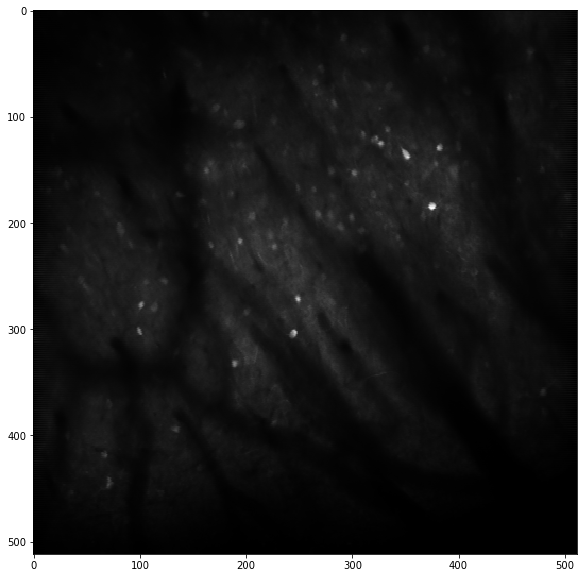

In [16]:
#m_rig = cm.load(mc.fname_tot_rig)
#border_to_0 = 0 if mc.border_nan is 'copy' else mc.border_to_0 # maximum shift to be used for trimming against NaNs

# load motion corrected movie
m_rig = cm.load(mmap_subset[0::2]) #cm.load(mc.mmap_file)
bord_px_rig = np.ceil(np.max(mc.shifts_rig)).astype(np.int)
#%% visualize templates
plt.figure(figsize = (20,10))
plt.imshow(mc.total_template_rig, cmap = 'gray')

Inspect the results by comparing the original movie. A more detailed presentation of the motion correction method can be found in the [demo motion correction](./demo_motion_correction.ipynb) notebook.

In [17]:
#%% inspect movie
downsample_ratio = 0.01
m_rig.resize(1, 1, downsample_ratio).play(
    q_max=99.5, fr=30, magnification=2, bord_px = 0*bord_px_rig) # press q to exit

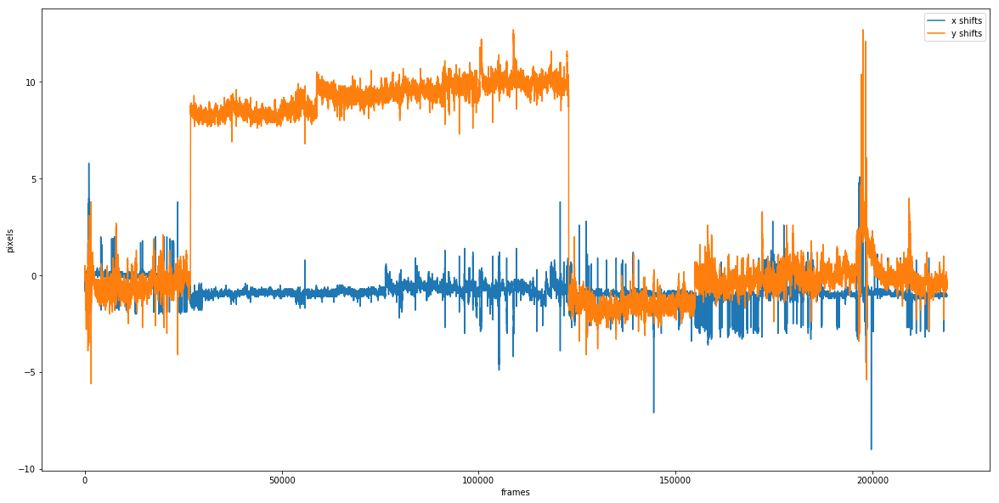

In [18]:

#%% plot rigid shifts
plt.close()
plt.figure(figsize = (20,10))
plt.plot(mc.shifts_rig)
plt.legend(['x shifts','y shifts'])
plt.xlabel('frames')
plt.ylabel('pixels')
plt.savefig(os.path.join(results_dir, 'mc_rigid_shifts.png'))


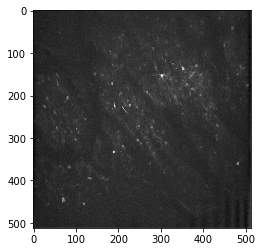

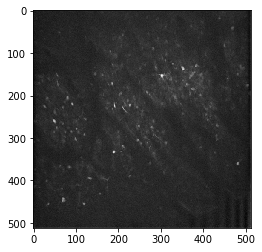

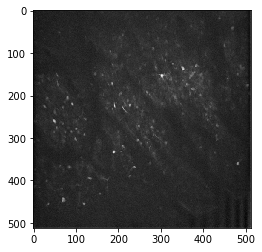

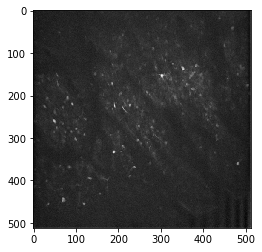

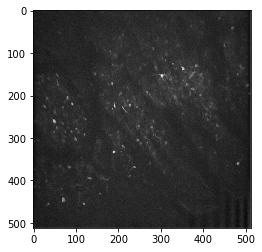

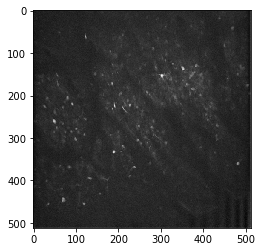

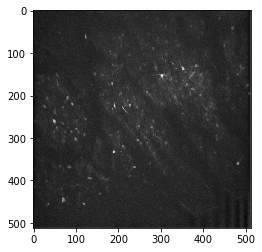

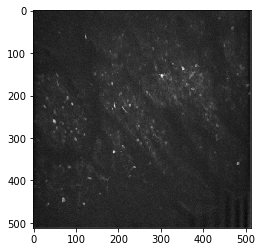

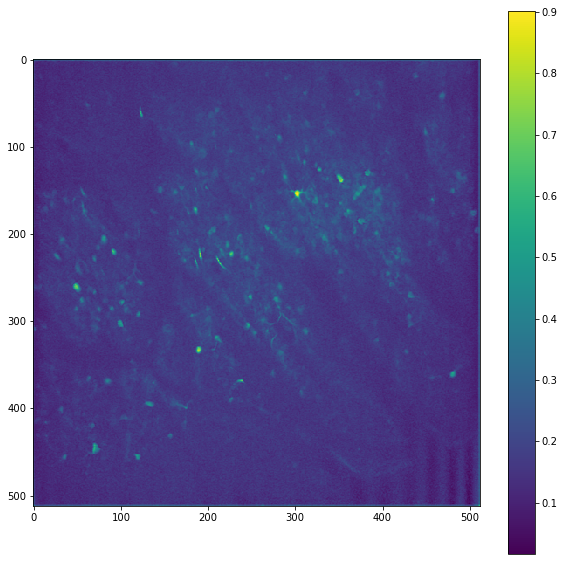

In [19]:
mc_corrs = m_rig.local_correlations(eight_neighbours=True, swap_dim=False)
plt.figure(figsize=(10,10))
plt.imshow(mc_corrs)
plt.colorbar()
plt.savefig(os.path.join(results_dir, 'mc_rigid_correlation_retino_evens.png'))


In [20]:
from mpl_toolkits.axes_grid1 import make_axes_locatable


In [21]:
fnames_subset = [f for f in fnames if 'retino' in f]
print(len(fnames_subset))

12


100%|██████████| 6/6 [00:31<00:00,  5.46s/it]


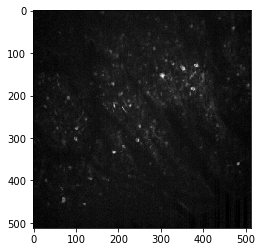

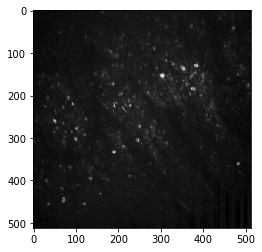

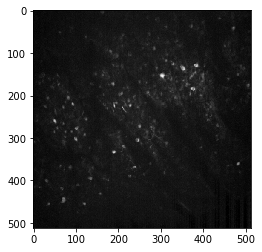

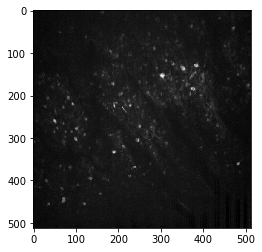

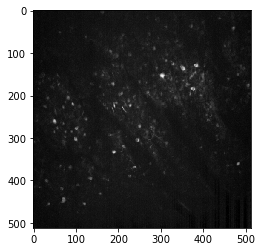

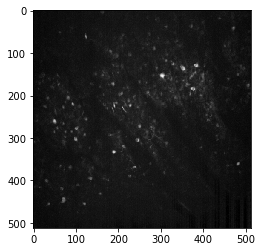

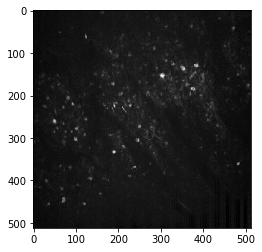

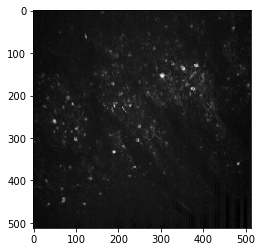

In [22]:
m_orig = cm.load_movie_chain(fnames_subset[0::2])
orig_corrs = m_orig.local_correlations(eight_neighbours=True, swap_dim=False)


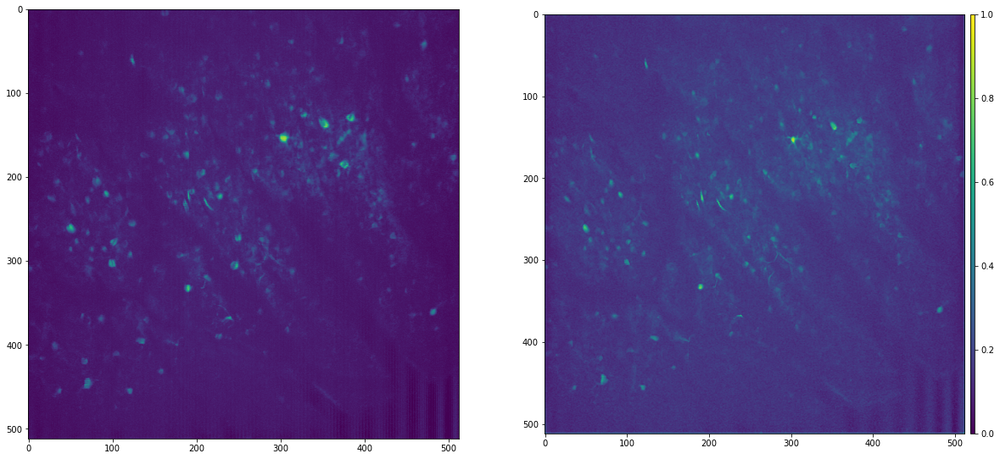

In [23]:
#m_orig = cm.load_movie_chain(fnames)
#orig_corrs = m_orig.local_correlations(eight_neighbours=True, swap_dim=False)

#%% plot correlation image pre/post MC:
fig, ax = plt.subplots(1,2, figsize = (20,10))
im = ax[0].imshow(orig_corrs, vmin=0, vmax=1)
im = ax[1].imshow(mc_corrs, vmin=0, vmax=1)


divider = make_axes_locatable(ax[1])
cax = divider.append_axes('right', size='1%', pad=0.1)
cbar = ax[1].figure.colorbar(im, cax=cax, orientation='vertical')
#cbar.set_label('%s' % metric_type)


plt.savefig(os.path.join(results_dir, 'mc_rigid_correlation_vs_raw_retino_evens.png'))


In [ ]:
#%% compare with original movie
display_movie = False
save_movie = False

ds_ratio = 0.05
m_orig = cm.load_movie_chain(fnames)

if display_movie:
    cm.concatenate([m_orig.resize(1, 1, ds_ratio) - mc.min_mov*mc.nonneg_movie,
                    m_rig.resize(1, 1, ds_ratio)], 
                   axis=2).play(fr=60, gain=15, magnification=2, offset=0)  # press q to exit
elif save_movie:
    # save movie
    mcmovie = cm.concatenate([m_orig.resize(1, 1, ds_ratio) - mc.min_mov*mc.nonneg_movie,
                    m_rig.resize(1, 1, ds_ratio)], 
                   axis=2)#.play(fr=60, gain=15, magnification=2, offset=0)
    mcmovie.save(os.path.join(results_dir, 'mc_rigid_mov.tif'))
    

## Memory mapping 

The cell below memory maps the file in order `'C'` and then loads the new memory mapped file. The saved files from motion correction are memory mapped files stored in `'F'` order. Their paths are stored in `mc.mmap_file`.

In [28]:
for i, mfile in enumerate(mc.mmap_file):
    print(i, os.path.split(mfile)[0])

0 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
1 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
2 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
3 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
4 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
5 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
6 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
7 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
8 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
9 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
10 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
11 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/raw_6ee6c4
12 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/rfs_run1/raw_8a27d9
13 /n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/

In [29]:
#%% MEMORY MAPPING
# memory map the file in order 'C'

#fname_tots = glob.glob(os.path.join(session_dir, fov, run, 'raw*', 'full_memmap_*.mmap'))
fname_tots = glob.glob(os.path.join(results_dir, 'full_memmap_*.mmap'))

if len(fname_tots) == 0 or do_mc is True:
    print("memmory mapping...")
    fname_new = cm.save_memmap(mc.mmap_file, base_name='%s/full_memmap_' % results_dir, order='C',
                               border_to_0=border_to_0) # exclude borders    
else:
    fname_new = fname_tots[0]
    
print(fname_new)


memmory mapping...
/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/caiman_results/retino_run2_rfs/full_memmap__d1_512_d2_512_d3_1_order_C_frames_218922_.mmap


In [112]:
# clean up other memmapped files:
mmap_tmp_files = [f for f in glob.glob(os.path.join(session_dir, fov, run, 'raw*', '*.mmap'))\
                  if 'full_memmap' not in f]
for f in mmap_tmp_files:
    os.remove(f)

In [30]:
# now load the file
Yr, dims, T = cm.load_memmap(fname_new)
images = np.reshape(Yr.T, [T] + list(dims), order='F') 
    #load frames in python format (T x X x Y)

Now restart the cluster to clean up the memory

In [31]:
#%% restart cluster to clean up memory
cm.stop_server(dview=dview)
c, dview, n_processes = cm.cluster.setup_cluster(
    backend='local', n_processes=None, single_thread=False)

/n/coxfs01/2p-pipeline/envs/caiman/lib/python3.6/site-packages/numpy/core/memmap.py:331: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  res = super(memmap, self).__getitem__(index)
/n/coxfs01/2p-pipeline/envs/caiman/lib/python3.6/site-packages/numpy/core/memmap.py:331: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  res = super(memmap, self).__getitem__(index)
/n/coxfs01/2p-pipeline/envs/caiman/lib/python3.6/site-packages/numpy/core/memmap.py:331: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr

/n/coxfs01/2p-pipeline/envs/caiman/lib/python3.6/site-packages/numpy/core/memmap.py:331: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  res = super(memmap, self).__getitem__(index)
/n/coxfs01/2p-pipeline/envs/caiman/lib/python3.6/site-packages/numpy/core/memmap.py:331: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  res = super(memmap, self).__getitem__(index)
/n/coxfs01/2p-pipeline/envs/caiman/lib/python3.6/site-packages/numpy/core/memmap.py:331: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr

## Run CNMF on patches in parallel

<p> <img src="../../docs/img/cnmf1.png" /> </p>

- The FOV is split is different overlapping patches that are subsequently processed in parallel by the CNMF algorithm.
- The results from all the patches are merged with special attention to idendtified components on the border.
- The results are then refined by additional CNMF iterations.

In [ ]:
%%capture
#%% RUN CNMF ON PATCHES

# First extract spatial and temporal components on patches and combine them
# for this step deconvolution is turned off (p=0)
opts.change_params({'p': 0})
cnm = cnmf.CNMF(n_processes, params=opts, dview=dview)
cnm = cnm.fit(images)

     9683289 [params.py:                 set():786] [6289] Changing key p in group preprocess from 1 to 0
     9683292 [params.py:                 set():786] [6289] Changing key p in group temporal from 1 to 0
     9683295 [params.py:                 set():786] [6289] Changing key n_processes in group patch from 1 to 24
     9683297 [params.py:                 set():786] [6289] Changing key init_batch in group online from 200 to 218922
     9683299 [params.py:                 set():786] [6289] Changing key medw in group spatial from None to (3, 3)
     9683302 [params.py:                 set():786] [6289] Changing key se in group spatial from None to [[1 1 1]
 [1 1 1]
 [1 1 1]]
     9683304 [params.py:                 set():786] [6289] Changing key ss in group spatial from None to [[1 1 1]
 [1 1 1]
 [1 1 1]]
     9683307 [params.py:                 set():786] [6289] Changing key n_pixels_per_process in group preprocess from None to 1226
     9683310 [params.py:                 set():78

## Run the entire pipeline up to this point with one command
It is possible to run the combined steps of motion correction, memory mapping, and cnmf fitting in one step as shown below. The command is commented out since the analysis has already been performed. It is recommended that you familiriaze yourself with the various steps and the results of the various steps before using it.

In [ ]:
# cnm1 = cnmf.CNMF(n_processes, params=opts, dview=dview)
# cnm1.fit_file(motion_correct=True)

### Inspecting the results
Briefly inspect the results by plotting contours of identified components against correlation image.
The results of the algorithm are stored in the object `cnm.estimates`. More information can be found in the definition of the `estimates` object and in the [wiki](https://github.com/flatironinstitute/CaImAn/wiki/Interpreting-Results).

In [ ]:
#%% plot contours of found components
Cn = cm.local_correlations(images.transpose(1,2,0))
Cn[np.isnan(Cn)] = 0
cnm.estimates.plot_contours_nb(img=Cn)
pl.savefig(os.path.join(results_dir, 'found_components_iter1.png'))

## Re-run (seeded) CNMF  on the full Field of View  
You can re-run the CNMF algorithm seeded on just the selected components from the previous step. Be careful, because components rejected on the previous step will not be recovered here.

In [ ]:
%%capture
#%% RE-RUN seeded CNMF on accepted patches to refine and perform deconvolution 
cnm.params.change_params({'p': p})
cnm2 = cnm.refit(images, dview=dview)

## Component Evaluation

The processing in patches creates several spurious components. These are filtered out by evaluating each component using three different criteria:

- the shape of each component must be correlated with the data at the corresponding location within the FOV
- a minimum peak SNR is required over the length of a transient
- each shape passes a CNN based classifier

<img src="../../docs/img/evaluationcomponent.png"/>

In [ ]:
#%% COMPONENT EVALUATION
# the components are evaluated in three ways:
#   a) the shape of each component must be correlated with the data
#   b) a minimum peak SNR is required over the length of a transient
#   c) each shape passes a CNN based classifier
# quality:

# {'SNR_lowest': 0.5,
#  'cnn_lowest': 0.1,
#  'gSig_range': None,
#  'min_SNR': 2.0,
#  'min_cnn_thr': 0.99,
#  'rval_lowest': -1,
#  'rval_thr': 0.85,
#  'use_cnn': True}

cnm2.estimates.evaluate_components(images, cnm2.params, dview=dview)

Plot contours of selected and rejected components

In [ ]:
#%% PLOT COMPONENTS
cnm2.estimates.plot_contours_nb(img=Cn, idx=cnm2.estimates.idx_components)
pl.savefig(os.path.join(results_dir, 'found_components_iter2.png'))

View traces of accepted and rejected components. Note that if you get data rate error you can start Jupyter notebooks using:
'jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10'

In [ ]:
Cn = cm.local_correlations(images.transpose(1,2,0))
Cn[np.isnan(Cn)] = 0

In [ ]:
# accepted components
cnm2.estimates.nb_view_components(img=Cn, idx=cnm2.estimates.idx_components)

#cnm.estimates.nb_view_components(img=Cn, idx=cnm.estimates.idx_components)

In [ ]:
# rejected components
if len(cnm2.estimates.idx_components_bad) > 0:
    cnm2.estimates.nb_view_components(img=Cn, idx=cnm2.estimates.idx_components_bad)
else:
    print("No components were rejected.")

### Extract DF/F values

In [ ]:
#%% Extract DF/F values
frames_window = fr * 30.0
cnm2.estimates.detrend_df_f(quantileMin=8, frames_window=250)

### Select only high quality components

In [ ]:
cnm2.estimates.select_components(use_object=True)

## Display final results

In [33]:
cnm2.estimates.nb_view_components(img=Cn, denoised_color='red')
print('you may need to change the data rate to generate this one: use jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10 before opening jupyter notebook')

## Closing, saving, and creating denoised version
### You can save an hdf5 file with all the fields of the cnmf object

In [ ]:
save_results = True
if save_results:
    cnm.save(os.path.join(results_dir, 'analysis_results.hdf5'))


### Stop cluster and clean up LOG files

In [ ]:
#%% STOP CLUSTER and clean up log files
cm.stop_server(dview=dview)
log_files = glob.glob('*_LOG_*')
for log_file in log_files:
    os.remove(log_file)

### View movie with the results
We can inspect the denoised results by reconstructing the movie and playing alongside the original data and the resulting (amplified) residual movie

In [ ]:
cnm2.estimates.play_movie(images, q_max=99.9, gain_res=2,
                                  magnification=2,
                                  bpx=border_to_0,
                                  include_bck=False)

The denoised movie can also be explicitly constructed using:

In [ ]:
#%% reconstruct denoised movie
denoised = cm.movie(cnm2.estimates.A.dot(cnm2.estimates.C) + \
                    cnm2.estimates.b.dot(cnm2.estimates.f)).reshape(dims + (-1,), order='F').transpose([2, 0, 1])

# Look at saved results

In [8]:
from caiman.source_extraction.cnmf.cnmf import load_CNMF


In [9]:
results_fpath = os.path.join(results_dir, 'analysis_results.hdf5')
print(results_fpath)
cnm = load_CNMF(results_fpath, n_processes=8)

/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/caiman_results/analysis_results.hdf5


/n/coxfs01/2p-pipeline/envs/caiman/lib/python3.6/site-packages/h5py/_hl/dataset.py:313: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  "Use dataset[()] instead.", H5pyDeprecationWarning)


In [10]:
cnm.estimates.A.shape

(262144, 839)

In [11]:
cnm.params.quality

{'SNR_lowest': 0.5,
 'cnn_lowest': 0.1,
 'gSig_range': None,
 'min_SNR': 2.0,
 'min_cnn_thr': 0.99,
 'rval_lowest': -1,
 'rval_thr': 0.85,
 'use_cnn': True}

In [12]:
# Re-evaluate components:

cnm.params.quality['SNR_lowest'] = 1.
# cnm.params.quality['cnn_lowest'] = 0.2
# {'SNR_lowest': 0.5,
#  'cnn_lowest': 0.1,
#  'gSig_range': None,
#  'min_SNR': 2.0,
#  'min_cnn_thr': 0.99,
#  'rval_lowest': -1,
#  'rval_thr': 0.85,
#  'use_cnn': True}

cnm.estimates.evaluate_components(images, cnm.params, dview=dview)
print(cnm.estimates.A.shape)

Using TensorFlow backend.
      218944 [deprecation.py:            new_func():323] [11945] From /n/coxfs01/2p-pipeline/envs/caiman/lib/python3.6/site-packages/tensorflow/python/framework/op_def_library.py:263: colocate_with (from tensorflow.python.framework.ops) is deprecated and will be removed in a future version.
Instructions for updating:
Colocations handled automatically by placer.
      218996 [deprecation.py:            new_func():506] [11945] From /n/coxfs01/2p-pipeline/envs/caiman/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py:3445: calling dropout (from tensorflow.python.ops.nn_ops) with keep_prob is deprecated and will be removed in a future version.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


USING MODEL:/n/home00/juliana.rhee/caiman_data/model/cnn_model.json
839/839 [==============================] - 2s 3ms/step
(262144, 839)


In [13]:
#%% Extract DF/F values
cnm.estimates.detrend_df_f(quantileMin=8, frames_window=250)

#%% Select only high quality components
cnm.estimates.select_components(use_object=True)

In [14]:
print(cnm.estimates.A.shape)

(262144, 300)


In [15]:
#%% plot contours of found components
Cn = cm.local_correlations(images.transpose(1,2,0))
Cn[np.isnan(Cn)] = 0
cnm.estimates.Cn = Cn
cnm.estimates.plot_contours_nb(img=Cn)

pl.savefig(os.path.join(results_dir, 'final_components_eval3.png'))

NameError: name 'pl' is not defined

In [103]:
cnm.save(os.path.join(results_dir, 'analysis_results.hdf5'))


/n/coxfs01/2p-pipeline/envs/caiman/lib/python3.6/site-packages/h5py/_hl/dataset.py:313: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  "Use dataset[()] instead.", H5pyDeprecationWarning)


In [17]:
print("A:", cnm.estimates.A.shape)
print("C:", cnm.estimates.C.shape)

A: (262144, 300)
C: (300, 26796)


In [18]:
Av = images.mean(axis=0)
cnm.estimates.plot_contours_nb(img=Av)

pl.savefig(os.path.join(results_dir, 'final_components_Av_eval3.png'))

<Figure size 432x288 with 0 Axes>

In [20]:
save_movie = False
frame_range = np.arange(0, 2233)

if save_movie:
    # Make save movie:

    # denoised = cm.movie(cnm2.estimates.A.dot(cnm2.estimates.C) + \
    #                     cnm2.estimates.b.dot(cnm2.estimates.f)).reshape(dims + (-1,), order='F').transpose([2, 0, 1])
    denoised = cm.movie(cnm.estimates.A.dot(cnm.estimates.C[:, frame_range])).reshape(dims + (-1,), order='F').transpose([2, 0, 1])
    denoised.save(os.path.join(results_dir, 'denoised_mov.tif'))


# Align

In [132]:
def label_figure(fig, data_identifier):
    fig.text(0, 1,data_identifier, ha='left', va='top', fontsize=8)

    

In [21]:
import pylab as pl
import matplotlib.gridspec as gridspec


In [22]:
import json
%pip install pandas
import pandas as pd

Note: you may need to restart the kernel to use updated packages.


In [23]:
%pip install seaborn
import seaborn as sns


Note: you may need to restart the kernel to use updated packages.


In [24]:
# Get SCAN IMAGE info for run:
# -------------------------------------------------------------------------

run_dir = os.path.join(session_dir, fov, run)

run = os.path.split(run_dir)[-1]
with open(os.path.join(run_dir, '%s.json' % run), 'r') as fr:
    scan_info = json.load(fr)
frame_tsecs = np.array(scan_info['frame_tstamps_sec'])
ntiffs = scan_info['ntiffs']

# Need to make frame_tsecs span all TIFs:
frame_tsecs_ext = np.hstack([frame_tsecs for i in range(ntiffs)])
print(len(frame_tsecs_ext))

nframes_per_file = len(frame_tsecs)


26796


In [25]:
# Load parsed paradigm info:

paradigm_fpath = glob.glob(os.path.join(run_dir, 'paradigm', 'files', 'parsed*.json'))[0]
with open(paradigm_fpath, 'r') as f:
    mwinfo = json.load(f)

conditions = list(set([cdict['stimuli']['stimulus'] for trial_num, cdict in mwinfo.items()]))
trials_by_cond = dict((cond, [int(k) for k, v in mwinfo.items() if v['stimuli']['stimulus']==cond]) \
                       for cond in conditions)
print(trials_by_cond)


trial_nums = np.array([v for k,v in trials_by_cond.items()])
trial_nums = sorted(trial_nums.flatten())


{'right': [2, 8, 12], 'top': [6, 7, 10], 'bottom': [3, 5, 9], 'left': [1, 4, 11]}


In [26]:
# Get cycle info:

curr_cond = 'right'
stimfreq = np.unique([v['stimuli']['scale'] for k,v in mwinfo.items() if v['stimuli']['stimulus']==curr_cond])[0]
stimperiod = 1./stimfreq # sec per cycle

n_frames = scan_info['nvolumes']
fr = scan_info['frame_rate']

n_cycles = int(round((n_frames/fr) / stimperiod))
#print n_cycles

n_frames_per_cycle = int(np.floor(stimperiod * fr))
cycle_starts = np.round(np.arange(0, n_frames_per_cycle * n_cycles, n_frames_per_cycle)).astype('int')
print(len(cycle_starts))

12


In [27]:
# Filter out flat liners:

ncomps = cnm.estimates.A.shape[-1]
flat_rois = [rid for rid in range(ncomps) if all(np.diff(cnm.estimates.C[rid])==0)]
print("%i out of %i evaluated components are flat." % (len(flat_rois), ncomps))

0 out of 300 evaluated components are flat.


In [28]:
print(flat_rois)

[]


In [29]:
# get average traces across condition reps:
active_cells = [i for i in range(ncomps) if i not in flat_rois]
print("N active cells:", len(active_cells))



N active cells: 300


In [30]:
# Get masks

masks = []
for rid in active_cells:
    msk = np.reshape(cnm.estimates.A[:, rid].toarray(), dims, order='F')
    masks.append(msk)
    
masks = np.array(masks)
print("Mask array:", masks.shape)

Mask array: (300, 512, 512)


#### Look at 1 roi's traces

# Do FFT analysis


In [32]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from caiman.utils.visualization import plot_contours

In [33]:
import matplotlib as mpl
import matplotlib.cm as cmx
from matplotlib.ticker import MaxNLocator, MultipleLocator, LogFormatter


In [34]:
retino_figdir = os.path.join(results_dir, 'figures')
if not os.path.exists(retino_figdir):
    os.makedirs(retino_figdir)

#### Do FFT

In [37]:

# label frequency bins
freqs = np.fft.fftfreq(n_frames, float(1/fr))
idx = np.argsort(freqs)
freqs=freqs[idx]
print(freqs)

# exclude DC offset from data
freqs=freqs[int(np.round(n_frames/2.))+1:]

# Identify freq idx:
freq_idx=np.argmin(np.absolute(freqs-stimfreq))#find out index of stimulation freq
top_freq_idx=np.where(freqs>1)[0][0]#find out index of 1Hz, to cut-off zoomed out plot
print("Target freq: %.3f Hz" % freqs[freq_idx])
#max_mod_idx=np.argmax(magnitudes[freq_idx, :],0)#best pixel index


[-22.31640161 -22.29640484 -22.27640806 ...  22.27640806  22.29640484
  22.31640161]
Target freq: 0.240 Hz


In [38]:
# do fft



def do_fft_analysis(avg_traces, idx, n_frames):
    fft_results = np.fft.fft(avg_traces, axis=0) #avg_traces.apply(np.fft.fft, axis=1)

    # get phase and magnitude
    mag_data = abs(fft_results)
    phase_data = np.angle(fft_results)

    # sort mag and phase by freq idx:
    mag_data = mag_data[idx]
    phase_data = phase_data[idx]

    # exclude DC offset from data
    mag_data = mag_data[int(np.round(n_frames/2.))+1:, :]
    phase_data = phase_data[int(np.round(n_frames/2.))+1:, :]

    #unpack values from frequency analysis
    mag_array = mag_data[freq_idx, :]
    phase_array = phase_data[freq_idx, :]

    #get magnitude ratio
    tmp = np.copy(mag_data)
    #tmp = np.delete(tmp,freq_idx,0)
    nontarget_mag_array=np.sum(tmp,0)
    magratio_array=mag_array/nontarget_mag_array

    return magratio_array, phase_array


In [39]:
#curr_cond = 'bottom'
magratios=[]
phases=[]
conds=[]
traces={}
for curr_cond in trials_by_cond.keys():
    avg_traces = []
    for rid in active_cells:
        tracemat = pd.DataFrame(np.reshape(cnm.estimates.C[rid], (nframes_per_file, ntiffs), order='F'), columns=trial_nums)
        avg = tracemat[trials_by_cond[curr_cond]].mean(axis=1)
        avg_traces.append(avg)
    avg_traces = pd.DataFrame(np.array(avg_traces).T, columns=active_cells)
    traces[curr_cond] = avg_traces

    magratio_array, phase_array = do_fft_analysis(avg_traces, idx, n_frames)

    magratios.append(magratio_array)
    phases.append(phase_array)
    conds.append(curr_cond)

In [40]:
magratios = pd.DataFrame(np.array(magratios).T, columns=conds)
phases = pd.DataFrame(np.array(phases).T, columns=conds)

In [68]:
ri_mx, ci_mx = np.where(magratios==magratios.max(axis=1).max())
max_mod_ix = int(ri_mx)
max_mod_condn = magratios.columns[int(ci_mx)]
print("max mag ratio ix: %i (cond %s)" % (max_mod_idx, max_mod_condn))

max mag ratio ix: 290 (cond right)


#### Look at 1 cell

(2233,)


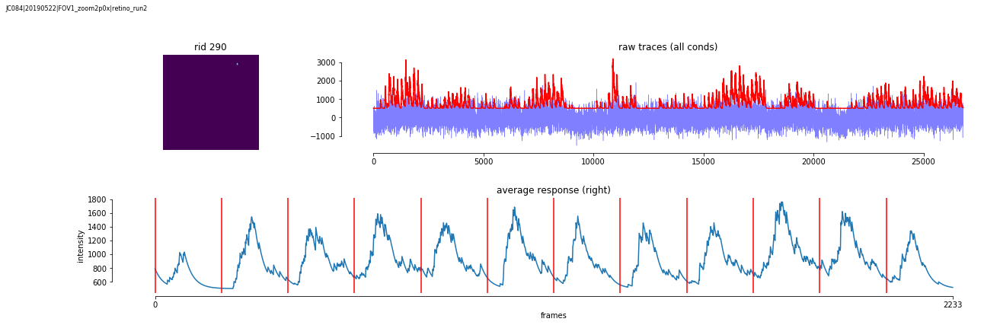

In [143]:
rid = max_mod_ix
curr_cond = max_mod_condn

fig = pl.figure(constrained_layout=True, figsize=(20,6))
gspec = gridspec.GridSpec(ncols=4, nrows=2, figure=fig, height_ratios=[1, 1])

ax1 = fig.add_subplot(gspec[0, 0])
ax1.imshow(np.reshape(cnm.estimates.A[:, rid].toarray(), cnm.dims, order='F'))
ax1.set_title('rid %i' % rid)
ax1.axis('off')

ax2 = fig.add_subplot(gspec[0, 1:])
ax2.plot(cnm.estimates.YrA[rid], 'b', alpha=0.5, lw=0.5)
ax2.plot(cnm.estimates.C[rid], 'r')
ax2.set_title('raw traces (all conds)')

ax3 = fig.add_subplot(gspec[1, 0:])
avg = traces[curr_cond][rid]
print(avg.shape)
ax3.plot(avg)
ax3.set_xticks([0, n_frames])
for cyc in cycle_starts:
    ax3.axvline(x=cyc, color='r')
ax3.set_title('average response (%s)' % curr_cond)
ax3.set_ylabel('intensity')
ax3.set_xlabel('frames')

sns.despine(trim=True, offset=4)
pl.subplots_adjust(top=0.85, left=0.1, hspace=0.5)
label_figure(fig, data_identifier)

pl.savefig(os.path.join(retino_figdir, 'best_cell_rid%05d.png' % rid))

#### Make average denoise movie of 1 cond:

In [1042]:
curr_cond = 'top'

print(curr_cond, trials_by_cond[curr_cond])

tot_n_frames = n_frames * len(trial_nums)
assert tot_n_frames == cnm.estimates.C.shape[-1], "Frame counts don't match!"

npix, ncomps = cnm.estimates.A.shape

top [6, 7, 10]


In [1043]:
mov = np.empty((npix, n_frames), dtype=cnm.estimates.C.dtype)
for tnum in trials_by_cond[curr_cond]:
    fr_ixs = [fi + ((tnum-1)*n_frames) for fi in np.arange(0, n_frames)]
    mov += cnm.estimates.A.dot(cnm.estimates.C[:, fr_ixs])
mov = mov / len(trials_by_cond[curr_cond])

print(mov.shape)  

(262144, 2233)


In [1044]:
save_movie = True

if save_movie:
    # Make save movie:

    # denoised = cm.movie(cnm2.estimates.A.dot(cnm2.estimates.C) + \
    #                     cnm2.estimates.b.dot(cnm2.estimates.f)).reshape(dims + (-1,), order='F').transpose([2, 0, 1])
    denoised = cm.movie(mov).reshape(dims + (-1,), order='F').transpose([2, 0, 1])
    denoised.save(os.path.join(results_dir, 'denoised_mov_av_%s.tif' % curr_cond))


# Summary figures by condition

In [269]:

def mask_rois(masks, value_array):
    nrois, d1, d2 = masks.shape
    dims = (d1, d2)
    
    value_mask =  np.ones(dims)*np.nan
    for rid in value_array.index.tolist():
        value_mask[masks[rid,:,:]>0] = value_array[rid]

    return value_mask

In [153]:
def plot_overlaid_maps(curr_cond, phases, magratios, mag_thr=0.03):

    phase_array = phases[curr_cond]
    magratio_array = magratios[curr_cond]

    phase_array_cont =  -1 * phase_array
    phase_array_cont = phase_array_cont % (2*np.pi)

    phase_mask = mask_rois(masks, phase_array_cont)
    magratio_mask = mask_rois(masks, magratio_array)

    magratio_mask_thr = np.copy(magratio_mask)
    magratio_mask_thr[magratio_mask<mag_thr] = np.nan
    print("max magratio:", magratio_array.max())


    fig, axes = pl.subplots(1,3, figsize=(12,5))
    ax = axes[0]
    im = ax.imshow(cnm.estimates.Cn, cmap='gray'); ax.axis('off');
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('bottom', size='5%', pad=0.1)
    ax.figure.colorbar(im, cax=cax, orientation='horizontal')

    ax = axes[1]
    axes[1].imshow(Av, cmap='gray'); ax.axis('off');
    im = ax.imshow(magratio_mask, cmap='inferno', alpha=0.7)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('bottom', size='5%', pad=0.1)
    ax.figure.colorbar(im, cax=cax, orientation='horizontal')

    ax = axes[2]
    axes[2].imshow(Av, cmap='gray'); ax.axis('off');
    im = ax.imshow(phase_mask, cmap='nipy_spectral', vmin=0, vmax=2*np.pi, alpha=0.7); ax.axis('off');
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('bottom', size='5%', pad=0.1)
    ax.figure.colorbar(im, cax=cax, orientation='horizontal')

    pl.subplots_adjust(wspace=0.5, hspace=0.5)

    return fig


#### Plot figures for each condition

In [765]:
curr_cond = 'bottom'

/n/coxfs01/2p-pipeline/envs/caiman/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: invalid value encountered in less
  del sys.path[0]


max magratio: 0.09963550330813074


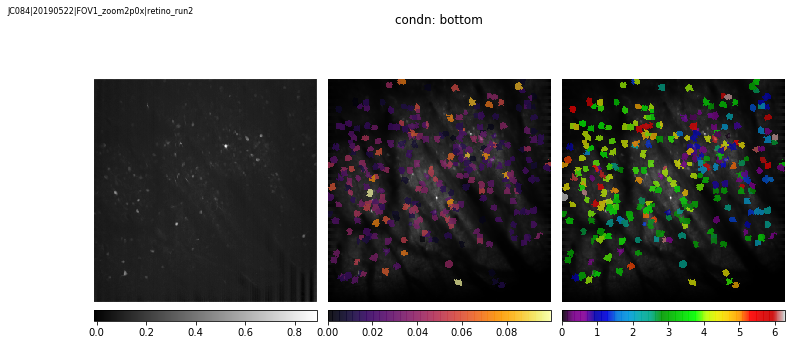

In [766]:
fig = plot_overlaid_maps(curr_cond, phases, magratios, mag_thr=0.03)
pl.suptitle('condn: %s' % curr_cond)

pl.subplots_adjust(wspace=0.05, left=0.1, top=0.8)
label_figure(fig, data_identifier)
pl.savefig(os.path.join(retino_figdir, 'overlay_magratio_phase_%s1_magthr%.2f.png' % (curr_cond, mag_thr)))


#### View each cell's traces

In [767]:
mag_thr=0.03


phase_array = phases[curr_cond]
magratio_array = magratios[curr_cond]

phase_array_cont =  -1 * phase_array
phase_array_cont = phase_array_cont % (2*np.pi)

    
thr_rids = magratio_array[magratio_array>=mag_thr].index.tolist()
print("[%s]: %i out of %i pass mag-thr %.2f" % (curr_cond, len(thr_rids), magratio_array.shape[0], mag_thr))


[bottom]: 127 out of 300 pass mag-thr 0.03


In [768]:
#magratio_array_thr = np.array([magratio_array[r] for r in thr_rids])
#phase_array_thr = np.array([phase_array_cont[r] for r in thr_rids])

In [769]:
sorted_mags = [i for i in np.argsort(magratio_array)[::-1] if i in thr_rids] # sort high to low
sorted_phase = [i for i in np.argsort(phase_array_cont) if i in thr_rids] # sort smallest to highest

In [770]:
for rid in sorted_phase:
    print(rid, phase_array_cont[rid])

31 0.22359543776588406
103 0.33536638112878814
136 0.3461837390917824
250 0.4059201816517286
286 0.411813025745714
32 0.4369040453095115
265 0.49863192652989125
293 0.5690668951860234
50 0.633760850239359
30 0.7096159615811365
277 0.729669223372987
119 0.731528991699283
55 0.8089003643239993
94 0.8491788716443531
93 0.849841690002404
291 0.8903217722203128
253 0.943352242741586
298 1.0830215348774241
1 1.4060655429235465
149 1.409961790645365
56 1.778359772908736
208 1.908366673267791
207 2.32400115423885
197 2.3752944758074293
252 2.394842623092741
237 2.4791793372008053
164 2.6510545670324
215 2.657481684722996
223 2.6852152860246132
231 2.7048670730202486
214 2.7577005705898356
242 2.7806710598156466
199 2.8480188079179887
161 2.853485829060822
195 2.858131586653574
229 2.8942963083519997
122 2.898882849782835
213 2.9346474998528898
174 2.9396016039472914
217 2.9533727530876694
218 2.958864011796318
243 2.9713057248171535
196 3.005992924169074
66 3.021541292127518
162 3.034730642368

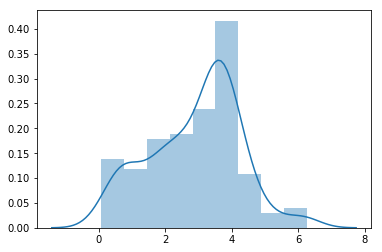

In [771]:
sns.distplot(phase_array_thr)

In [772]:
print(curr_cond)

bottom


In [773]:

def plot_sorted_traces(avg_traces, sorted_list, hue_values, hue_label='hue', cmap='cool', 
                       vmin=None, vmax=None, cbar_orientation='vertical', cbar_invert=False, cbar_aspect=False,
                      stimlines=[], ticks_every=0.1, offset=200, figsize=(8, 16), label_rois=False):

    vmin = vmin if vmin is not None else hue_values[sorted_list].min()
    vmax = vmax if vmax is not None else hue_values[sorted_list].max()
    #cnorm = mpl.colors.LogNorm(vmin=vmin,vmax=vmax)
    cnorm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

    scalarmap = cmx.ScalarMappable(norm=cnorm, cmap=cmap)
    print("scaled cmap lim:", scalarmap.get_clim())

    

    fig, ax = pl.subplots(figsize=figsize)
    #offset = 200
    last_y = 0
    for ri,rid in enumerate(sorted_list):
        cval = scalarmap.to_rgba(hue_values[rid])
        im = ax.plot(avg_traces[rid] + last_y, color=cval, lw=1, alpha=0.8)
        last_y = avg_traces[rid].mean() + ri*offset

    for cyc in stimlines:
        ax.axvline(x=cyc, color='k', linestyle=':', lw=0.75, alpha=0.5)

    sns.despine(trim=True, offset=8, left=True, bottom=True)
    if label_rois:
        ax.set_yticks([ri*offset + avg_traces[rid].mean() for ri,rid in enumerate(sorted_list)])
        ax.set_yticklabels([rid for rid in sorted_list])
    else:
        ax.set_yticks([])
        ax.set_yticklabels([])
    ax.set_xticks([])
    ax.set_xticklabels([])

    pl.subplots_adjust(left=0.01, top=0.9, right=0.9)

    # colorbar
    bounds = np.linspace(vmin, vmax)
    scalarmap.set_array(bounds)
    if cbar_orientation == 'vertical':
        if cbar_aspect:
            cbar_axes = [0.87, 0.17, 0.09, 0.05]
        else:
            cbar_axes = [0.91, 0.17, 0.02, 0.3]
    else:
        cbar_axes = [0.87, 0.17, 0.09, 0.05]
        
    cbar_ax = fig.add_axes(cbar_axes)
    cbar = fig.colorbar(scalarmap, cax=cbar_ax, #boundaries=np.arange(-0.5, ncolors, 1), \
                        ticks=bounds, norm=cnorm, orientation=cbar_orientation) #, format=formatter)
    
    if cbar_orientation == 'vertical':
        ytick_locator = MultipleLocator(ticks_every) #MaxNLocator(min_n_ticks=20) # MultipleLocator(0.01) #MaxNLocator(integer=True)
        cbar_ax.yaxis.set_major_locator(ytick_locator)
        cbar_ax.set_ylabel('%s' % hue_label, fontsize=8)
        if cbar_invert:
            cbar_ax.invert_yaxis()
    else:
        xtick_locator = MultipleLocator(ticks_every) #MaxNLocator(min_n_ticks=20) # MultipleLocator(0.01) #MaxNLocator(integer=True)
        cbar_ax.xaxis.set_major_locator(xtick_locator)
        cbar_ax.set_xlabel('%s' % hue_label, fontsize=8)
        if cbar_invert:
            cbar_ax.invert_xaxis()


    return fig


In [774]:
curr_cond

'bottom'

In [775]:
traces[curr_cond].shape

(2233, 300)

scaled cmap lim: (0.030260723602241798, 0.09963550330813074)
traces_sortby_magratio_bottom


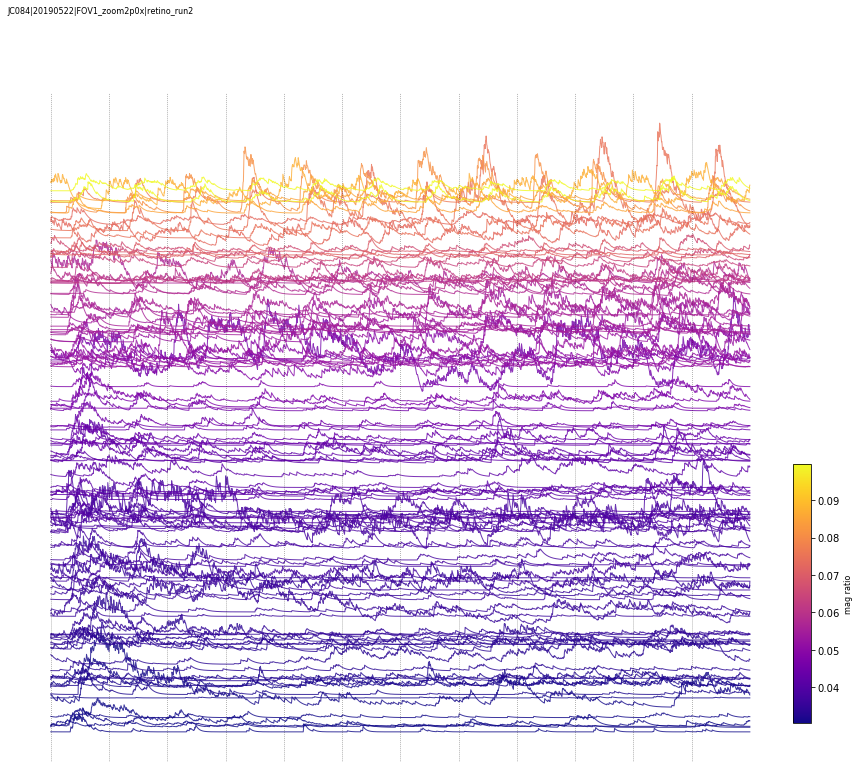

In [776]:
figsize=(12, 12)

cmap = plt.get_cmap('plasma') 
fig = plot_sorted_traces(traces[curr_cond], sorted_mags[::-1], magratio_array, hue_label='mag ratio', 
                         offset=200, cmap=cmap, cbar_aspect=False,
                         stimlines=cycle_starts, ticks_every=0.01, figsize=figsize)

pl.subplots_adjust(left=0.01, top=0.9)
label_figure(fig, data_identifier)

figname = 'traces_sortby_magratio_%s' % curr_cond
pl.savefig(os.path.join(retino_figdir, '%s.png' % figname))
print(figname)

In [777]:
curr_cond

'bottom'

scaled cmap lim: (0.0, 6.283185307179586)
traces_sortby_phase_bottom


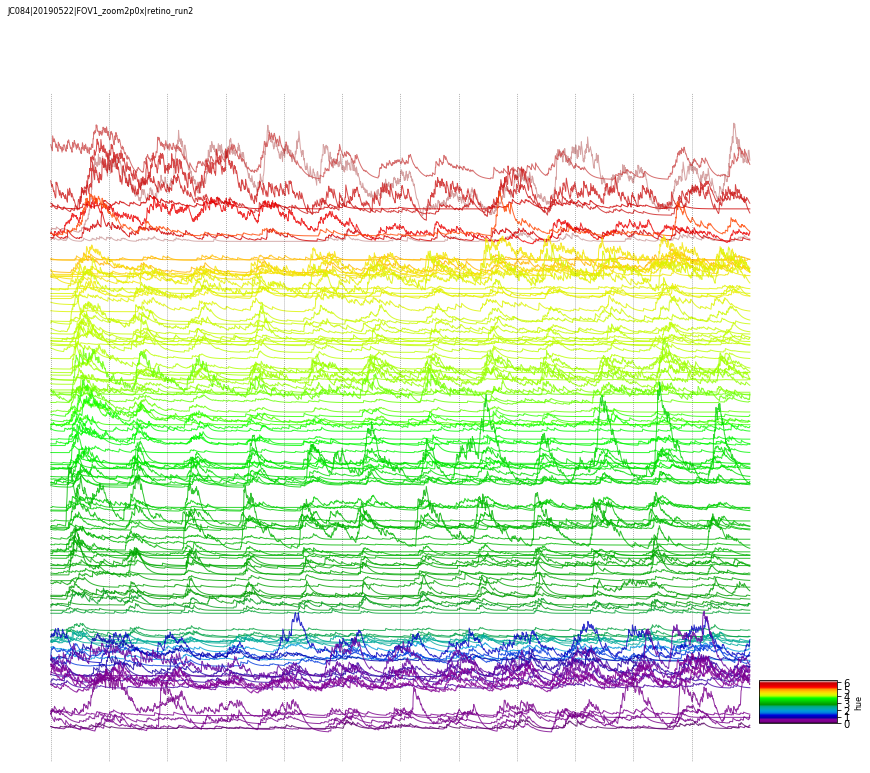

In [781]:
cmap = plt.get_cmap('nipy_spectral') 

cbar_invert = curr_cond in ['right', 'top']
cbar_orientation = 'vertical' if curr_cond in ['top', 'bottom'] else 'horizontal'
cbar_aspect = cbar_orientation == 'vertical'

if curr_cond in ['right', 'bottom']:
    sorted_phase = sorted_phase[::-1]
    
fig = plot_sorted_traces(traces[curr_cond], sorted_phase, phase_array_cont, offset=-200,
                         cmap=cmap, stimlines=cycle_starts, ticks_every=1,
                         cbar_orientation=cbar_orientation, cbar_invert=cbar_invert, cbar_aspect=cbar_aspect,
                         vmin=0, vmax=2*np.pi, figsize=figsize)

label_figure(fig, data_identifier)

figname = 'traces_sortby_phase_%s' % curr_cond
pl.savefig(os.path.join(retino_figdir, '%s.png' % figname))
print(figname)

In [1058]:
from matplotlib.colors import ListedColormap
cmap = plt.cm.nipy_spectral  # define the colormap
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]

# create the new map
cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)

vmin = 0
vmax = 2*np.pi
cmap = plt.get_cmap('nipy_spectral') 
newcmp = ListedColormap(cmap(np.linspace(vmin, vmax, 8)))


In [1060]:
newcmp.get_clim()

AttributeError: 'ListedColormap' object has no attribute 'get_clim'

# Plot by position

In [680]:
phases_cont = -1 * phases
phases_cont = phases_cont % (2*np.pi)

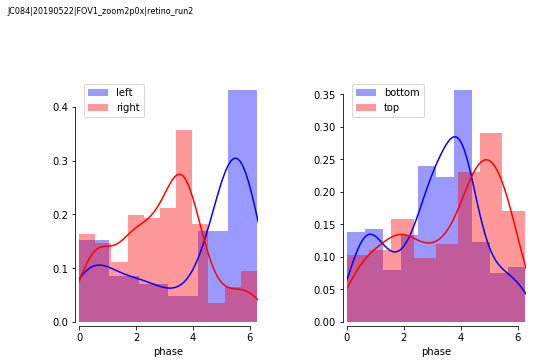

In [681]:
fig, axes = pl.subplots(1,2, figsize=(8,5))

#pl.scatter(phases_cont['left'], range(phases_cont.shape[0]), c='r')
#pl.scatter(phases_cont['right'], range(phases_cont.shape[0]), c='b')
sns.distplot(phases_cont['left'], color='b', label='left', ax=axes[0])
sns.distplot(phases_cont['right'], color='r', label='right', ax=axes[0])
axes[0].legend()
axes[0].set_xlabel('phase')
axes[0].set_xlim([0, 2*np.pi])

sns.distplot(phases_cont['bottom'], color='b', label='bottom', ax=axes[1])
sns.distplot(phases_cont['top'], color='r', label='top', ax=axes[1])
axes[1].legend()
axes[1].set_xlabel('phase')
axes[1].set_xlim([0, 2*np.pi])

sns.despine(trim=True, offset=4)
pl.subplots_adjust(wspace=0.5, top=0.8)

label_figure(fig, data_identifier)

pl.savefig(os.path.join(retino_figdir, 'distn_phases_by_cond.png'))

In [682]:
mag_thr = 0.03
strong_cells = [i for i in magratios.index.tolist() if all(magratios.iloc[i]>=mag_thr)]

# mag_thr = 0.05
# strong_cells = np.where(magratios.min(axis=1) > mag_thr)[0]
# strong_cells

print("%i out of %i cells meet min mag-thr of %.2f for all conds." % (len(strong_cells), magratios.shape[0], mag_thr))

47 out of 300 cells meet min mag-thr of 0.03 for all conds.


In [683]:
rid = 161
print(phases_cont['left'][rid], phases_cont['right'][rid])
#mval = np.mean([phases_cont['left'][171], phases_cont['right'][171]])
mval = (phases_cont['left'][rid] - phases_cont['right'][rid]) / 2.
print(mval)

mvalc = (-1*mval) % (2*np.pi)
print(mvalc)
print(np.pi-mvalc)

5.081533403506629 3.5451353145454494
0.76819904448059
5.514986262698996
-2.373393609109203


In [684]:
print(phases['left'][rid], phases['right'][rid])
#mval = np.mean([phases['left'][171], phases['right'][171]])
mval = (phases['left'][rid] - phases['right'][rid]) / 2.

print(mval)
mvalc = (-1*mval) % (2*np.pi)
print(mvalc)


1.2016519036729572 2.738049992634137
-0.7681990444805898
0.7681990444805898


In [685]:
azim[strong_cells]

2      1.588007
18     1.569277
19     1.635263
21     2.055496
30     0.433156
44     1.451826
48     0.952139
55     2.510225
61     0.867945
73     1.014107
93     0.773866
94     0.603182
101    0.880338
103    0.750213
116    1.268293
118    1.286631
119    0.228791
125    0.468639
134    0.673415
136    0.582555
138    0.792728
149   -2.571066
152    0.541781
155    0.619279
156    0.856318
161    0.768199
162    0.785133
179   -1.731980
184    0.562688
196   -1.045012
207    0.755530
208    0.877367
216    0.746478
218    0.569306
229    0.456113
232    0.935704
243    0.501441
248    1.004433
258   -1.045219
267    0.913139
271    0.803589
276   -2.368224
277    0.435338
288    1.750092
290    1.649530
294    1.357674
298    0.771256
dtype: float64

In [782]:
use_cont = True
filter_by_mag = True

if use_cont:
    elev = (phases_cont['bottom'] - phases_cont['top']) / 2.
    azim = (phases_cont['left'] - phases_cont['right']) / 2.

    vmin = -np.pi
    vmax = np.pi
    
else:
    elev = (phases['bottom'] - phases['top']) / 2.
    azim = (phases['left'] - phases['right']) / 2.

    elev_c = -1 * elev
    elev_c = elev_c % (2*np.pi)

    azim_c = -1 * azim
    azim_c = azim_c % (2*np.pi)

    vmin = 0
    vmax = 2*np.pi
    
    azim = copy.copy(azim_c)
    elev = copy.copy(elev_c)

magratios_all = magratios.mean(axis=1)
    
if filter_by_mag:
    azim_phase = mask_rois(masks, azim[strong_cells])
    elev_phase = mask_rois(masks, elev[strong_cells])
else:
    azim_phase = mask_rois(masks, azim)
    elev_phase = mask_rois(masks, elev)


In [783]:
magratios_all.shape

(300,)

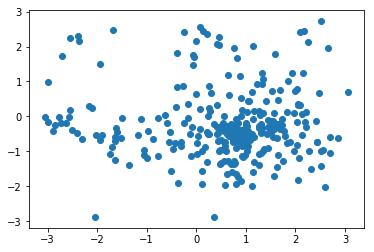

In [784]:
pl.figure()
pl.scatter(azim, elev)

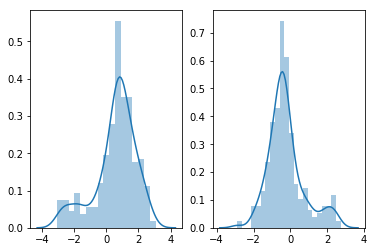

In [785]:
fig, ax = pl.subplots(1,2)
sns.distplot(azim, ax=ax[0])
sns.distplot(elev, ax=ax[1])

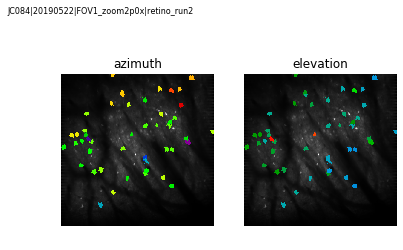

In [786]:

fig, axes = pl.subplots(1,2)
ax = axes[0]
ax.imshow(Av, cmap='gray'); ax.axis('off');
ax.imshow(azim_phase, cmap='nipy_spectral', vmin=vmin, vmax=vmax)
ax.set_title('azimuth')

ax = axes[1]
ax.imshow(Av, cmap='gray'); ax.axis('off');
ax.imshow(elev_phase, cmap='nipy_spectral', vmin=vmin, vmax=vmax)
ax.set_title('elevation')

if filter_by_mag:
    figname = 'absolute_maps_filter_magthr_%.2f_allconds_ncomps%i' % (mag_thr, len(strong_cells))
else:
    figname = 'absolute_maps_all_comps'

label_figure(fig, data_identifier)
pl.savefig(os.path.join(retino_figdir, '%s.png' % figname))



#### Plot traces for best cells

In [787]:
curr_cond

'bottom'

In [788]:
#azim_thr = [azim[r] for r in strong_cells]
#elev_thr = [azim[r] for r in strong_cells]
#magratio_thr = [magratios.max(axis=1)[r] for r in strong_cells]

sorted_phase_abs_azim = [i for i in np.argsort(azim)[::-1] if i in strong_cells]
sorted_phase_abs_elev = [i for i in np.argsort(elev)[::-1] if i in strong_cells]
sorted_magratio_abs = [i for i in np.argsort(magratios_all)[::-1] if i in strong_cells]



In [789]:
for rid in sorted_magratio_abs[0:10]:
    print(rid, magratios_all[rid])

288 0.08041154725017284
294 0.07925547549200465
290 0.07765068433566101
155 0.07687504972835361
298 0.07608376959135074
271 0.07177060344057011
229 0.0708531607115931
248 0.06294747074971763
30 0.06271587516561965
103 0.06097180166867397


In [705]:
magratios_all[sorted_magratio_abs]

288    0.080412
294    0.079255
290    0.077651
155    0.076875
298    0.076084
271    0.071771
229    0.070853
248    0.062947
30     0.062716
103    0.060972
179    0.060287
207    0.059854
2      0.058484
161    0.058384
138    0.058266
277    0.057406
73     0.055567
118    0.054838
152    0.054385
93     0.052839
134    0.052789
19     0.052740
18     0.052532
232    0.050588
208    0.050557
258    0.049782
48     0.049706
267    0.048125
196    0.047930
184    0.047190
125    0.046386
243    0.045380
55     0.045358
21     0.045261
162    0.044350
44     0.044056
61     0.043967
216    0.043958
218    0.042855
94     0.042373
156    0.042262
119    0.041524
116    0.040998
101    0.040350
149    0.040024
136    0.038460
276    0.033592
dtype: float64

In [464]:
sortee

'right'

In [809]:
curr_cond = 'right'


scaled cmap lim: (0.03359228809596383, 0.08041154725017284)


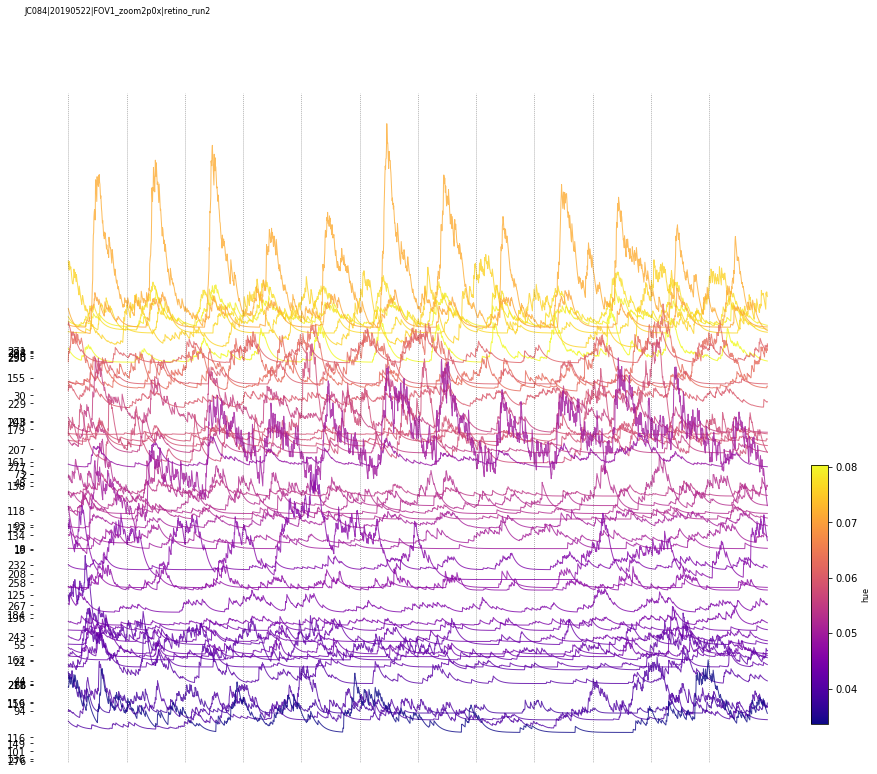

In [810]:
cmap = plt.get_cmap('plasma') 


fig = plot_sorted_traces(traces[curr_cond], sorted_magratio_abs, magratios_all, offset=-200,
                         cmap=cmap, stimlines=cycle_starts, ticks_every=0.01, figsize=figsize,
                        label_rois=True)
                         #vmin=-np.pi, vmax=np.pi,
                         #cbar_orientation=cbar_orientation, cbar_invert=cbar_invert, cbar_aspect=cbar_aspect)

label_figure(fig, data_identifier)

figname = 'sortby_magratio_traces_%s_top%i_magthr%.2f' % (curr_cond, len(strong_cells), mag_thr)
pl.savefig(os.path.join(retino_figdir, '%s.png' % figname))



scaled cmap lim: (-3.141592653589793, 3.141592653589793)
sortby_phase_traces_right_top47_magthr0.03


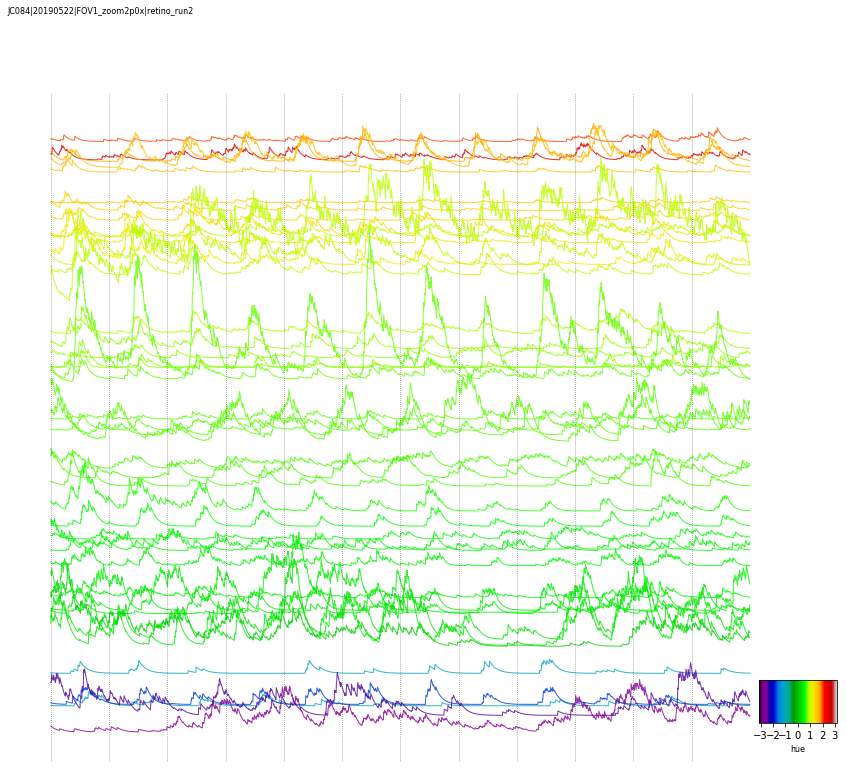

In [811]:
cmap = plt.get_cmap('nipy_spectral') 

cbar_invert = False
cbar_orientation = 'vertical' if curr_cond in ['top', 'bottom'] else 'horizontal'
cbar_aspect = cbar_orientation == 'vertical'

fig = plot_sorted_traces(traces[curr_cond], sorted_phase_abs_azim, azim, offset=-400,
                         cmap=cmap, stimlines=cycle_starts, ticks_every=1,
                         vmin=-np.pi, vmax=np.pi, figsize=figsize, 
                         cbar_orientation=cbar_orientation, cbar_invert=cbar_invert, cbar_aspect=cbar_aspect)

label_figure(fig, data_identifier)

figname = 'sortby_phase_traces_%s_top%i_magthr%.2f' % (curr_cond, len(strong_cells), mag_thr)
pl.savefig(os.path.join(retino_figdir, '%s.png' % figname))
print(figname)


### Look at 1 cycle

In [485]:
curr_cond = 'top'

tracemat = np.array(traces[curr_cond].values)

mean_cycle = tracemat[cycle_starts[0]:cycle_starts[0]+n_frames_per_cycle]
for cyc in cycle_starts[1:]:
    mean_cycle += (tracemat[cyc:cyc+n_frames_per_cycle])
mean_cycle = mean_cycle / float(n_cycles)

In [502]:
top_cells = np.argsort(magratios.max(axis=1)[strong_cells])[::-1]

In [503]:
top_cells

298    44
294    34
290    23
288    40
277    45
276    43
271    46
267    13
258     4
248    27
243    20
232    37
229    42
218    15
216    30
208     9
207     0
196    18
184    31
179    10
162     3
161    25
156    35
155    36
152     7
149     2
138    38
136     1
134    33
125    22
119    29
118    17
116    28
103    39
101    12
94      6
93     11
73      5
61     26
55     16
48     32
44      8
30     14
21     24
19     21
18     19
2      41
dtype: int64

In [532]:
for rid in sorted_magratio_abs: #top_cells.index.tolist():
    print(rid, magratio_thr[rid])

44 0.10427009096773984
34 0.10107093448750136
23 0.09963550330813074
40 0.09513737135794062
45 0.09220753042553323
43 0.09184362490232466
46 0.08708909484064428
13 0.08653754143103311
4 0.08100665455341606
27 0.07729608077879155
20 0.0744584043915925
37 0.07376151353694295
42 0.0734331273572946
15 0.07319203126003153
30 0.07303469324529054
9 0.07178927670153848
0 0.07149767612476964
18 0.07134966699722362
31 0.07047569467940276
10 0.0703529022627143
3 0.06982611629035397
25 0.06838376200705423
35 0.06802964088842739
36 0.06687802432583445
7 0.06479664026401223
2 0.06394405960196582
38 0.06376002109322437
1 0.06342413393146465
33 0.06173024950424936
22 0.06122274171543486
29 0.05794035040178379
17 0.05662624293894317
28 0.055880172290516124
39 0.05516609396932594
12 0.05378713532326054
6 0.05354582219138916
11 0.053376061535329755
5 0.0526992443343587
26 0.05061655705786966
16 0.05011692868479862
32 0.04990762738410656
8 0.04785958771869824
14 0.046722627177788266
24 0.04549905846929945

In [533]:
strong_cells[44]

290

In [537]:
sorter

array([44, 34, 23, 40, 45, 43, 46, 13,  4, 27, 20, 37, 42, 15, 30,  9,  0,
       18, 31, 10,  3, 25, 35, 36,  7,  2, 38,  1, 33, 22, 29, 17, 28, 39,
       12,  6, 11,  5, 26, 16, 32,  8, 14, 24, 21, 19, 41])

scaled cmap lim: (-3.141592653589793, 3.141592653589793)


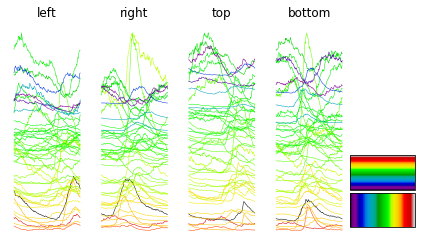

In [856]:
sort_by_mag = False

fig, axes = pl.subplots(1, 4, figsize=(6,4))

if sort_by_mag:
    vmin = min(magratios_all)
    vmax = max(magratios_all)
    cnorm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    scalarmap = cmx.ScalarMappable(norm=cnorm, cmap='plasma')
    sorter = np.copy(sorted_magratio_abs)
    hue_values = np.copy(magratios_all)
    ticks_every=0.02
    hue_label = ''
    cbar_orientation='vertical'
    cbar_axes = [0.91, 0.17, 0.02, 0.3]
    cbar_axes2 = None
else:
    vmin = -np.pi
    vmax = np.pi
    cnorm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)
    scalarmap = cmx.ScalarMappable(norm=cnorm, cmap='nipy_spectral')
    sorter = np.copy(sorted_phase_abs_azim)
    hue_values = np.copy(azim)
    ticks_every=1.0
    hue_label = 'phase'
    cbar_orientation='horizontal'
    cbar_axes = [0.91, 0.17, 0.15, 0.12]
    cbar_axes2 = [0.91, 0.30, 0.15, 0.12]
    
print("scaled cmap lim:", scalarmap.get_clim())
offset = 50


for ci,curr_cond in enumerate(['left', 'right', 'top', 'bottom']): #enumerate(trials_by_cond.keys()):
    tracemat = np.array(traces[curr_cond].values)
    mean_cycle = tracemat[cycle_starts[0]:cycle_starts[0]+n_frames_per_cycle]
    for cyc in cycle_starts[1:]:
        mean_cycle += (tracemat[cyc:cyc+n_frames_per_cycle])
    mean_cycle = mean_cycle / float(n_cycles)
    
    ax = axes[ci]
    for ri, rid in enumerate(sorter): #enumerate(sorted_phase_abs):
        if rid == 290:
            cval = 'k'
        else:
            cval = scalarmap.to_rgba(hue_values[rid])
        ax.plot(mean_cycle[:, rid] + ri*offset, color=cval, lw=0.5)
    ax.set_title(curr_cond)
    
    ax.set_xticks([]); ax.set_yticks([]);
    ax.set_xticklabels([]); ax.set_yticklabels([]);

# colorbar

bounds = np.linspace(vmin, vmax)
scalarmap.set_array(bounds)

cbar_ax = fig.add_axes(cbar_axes)
cbar = fig.colorbar(scalarmap, cax=cbar_ax, #boundaries=np.arange(-0.5, ncolors, 1), \
                    ticks=[], norm=cnorm, orientation=cbar_orientation) #, format=formatter)
if cbar_orientation == 'vertical':
    ytick_locator = MultipleLocator(ticks_every) #MaxNLocator(min_n_ticks=20) # MultipleLocator(0.01) #MaxNLocator(integer=True)
    cbar_ax.yaxis.set_major_locator(ytick_locator)
    cbar_ax.set_ylabel('%s' % hue_label, fontsize=8)
    if cbar_invert:
        cbar_ax.invert_yaxis()
else:
    cbar_ax.set_xticks([])
    cbar_ax.set_xticklabels([])
    if cbar_axes2 is not None:
        cbar_ax = fig.add_axes(cbar_axes2)
        cbar = fig.colorbar(scalarmap, cax=cbar_ax, #boundaries=np.arange(-0.5, ncolors, 1), \
                            ticks=[], norm=cnorm, orientation='vertical') #, format=formatter)

sns.despine(left=True, bottom=True)


# Movies

In [857]:
import tifffile as tf

In [1045]:
curr_cond = 'top'


In [1046]:
mov_fpath = os.path.join(results_dir, 'denoised_mov_av_%s.tif' % curr_cond)
mov = tf.imread(mov_fpath)
n_fr, d1, d2 = mov.shape

In [1047]:
mw_start_ixs = mwinfo['%i' % trials_by_cond[curr_cond][0]]['stiminfo']['start_indices']

In [1048]:
mwpos = np.array(mwinfo['%i' % trials_by_cond[curr_cond][0]]['stiminfo']['values'][0:mw_start_ixs[1]])
len(mwpos)
mwpos = mwpos - mwpos.min()

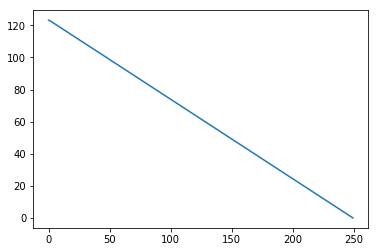

In [1049]:
pl.plot(mwpos)

In [1050]:

iframes = np.linspace(mwpos[0], mwpos[-1], n_frames_per_cycle)

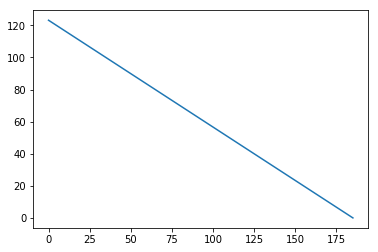

In [1051]:
pl.plot(iframes)

In [1052]:
iframes[0:n_frames_per_cycle]

array([123.22000122, 122.55394716, 121.8878931 , 121.22183904,
       120.55578498, 119.88973092, 119.22367686, 118.5576228 ,
       117.89156874, 117.22551467, 116.55946061, 115.89340655,
       115.22735249, 114.56129843, 113.89524437, 113.22919031,
       112.56313625, 111.89708219, 111.23102813, 110.56497407,
       109.89892001, 109.23286595, 108.56681189, 107.90075783,
       107.23470377, 106.5686497 , 105.90259564, 105.23654158,
       104.57048752, 103.90443346, 103.2383794 , 102.57232534,
       101.90627128, 101.24021722, 100.57416316,  99.9081091 ,
        99.24205504,  98.57600098,  97.90994692,  97.24389286,
        96.57783879,  95.91178473,  95.24573067,  94.57967661,
        93.91362255,  93.24756849,  92.58151443,  91.91546037,
        91.24940631,  90.58335225,  89.91729819,  89.25124413,
        88.58519007,  87.91913601,  87.25308195,  86.58702788,
        85.92097382,  85.25491976,  84.5888657 ,  83.92281164,
        83.25675758,  82.59070352,  81.92464946,  81.25

In [1053]:
#stimsize = int(round(iframes.max()))

allpos = np.array(mwinfo['%i' % trials_by_cond[curr_cond][0]]['stiminfo']['values'])
stimsize = int(np.ceil(allpos.max() - allpos.min()))
print(stimsize)

#stimsize = len(iframes)

124


0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1
0
1
1


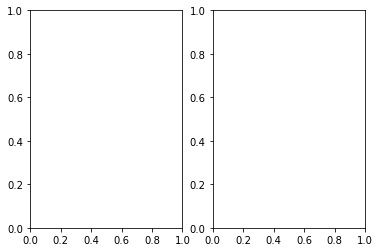

In [1054]:
fig, ax = pl.subplots(1,2)
stimulus = np.zeros((stimsize, stimsize), dtype=np.int8)
if curr_cond in ['left', 'right']:
    stimulus[:, 0:2] = 255
else:
    stimulus[0:2, :] = 255
    
iframes = [int(round(i)) for i in iframes]
pos_int = 0
stim_list=[]
for fi, fpos in enumerate(iframes):
    stimulus = np.roll(stimulus, pos_int, axis=0)
    if fi < len(iframes)-1:
        pos_int = abs(iframes[fi+1] - fpos)
    print(pos_int)
    stim_list.append(stimulus)

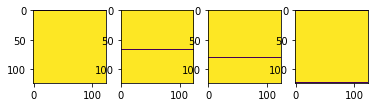

In [1055]:
fig, ax = pl.subplots(1,4)
ax[0].imshow(stim_list[0])
ax[1].imshow(stim_list[100])
ax[2].imshow(stim_list[120])
ax[3].imshow(stim_list[185])


In [1056]:
stim_mov = np.array(stim_list)
full_stim_mov = np.vstack([stim_mov for _ in range(n_cycles)])
stim_mov_fpath = '%s_stimulus.tif' % os.path.splitext(mov_fpath)[0]
tf.imsave(stim_mov_fpath, full_stim_mov)


In [1008]:
os.path.splitext(mov_fpath)

('/n/coxfs01/2p-data/JC084/20190522/FOV1_zoom2p0x/retino_run2/caiman_results/denoised_mov_av_right',
 '.tif')

In [1025]:
stim_mov.shape

(186, 124, 124)

In [1032]:
np.vstack([stim_mov for _ in range(n_cycles)])

(2232, 124, 124)